In [96]:
from gliomi import *

In [118]:
repo = SequenceRepoPasquini("/data/RMN/dataset-gliomi/registered")

In [119]:
repo.get_sequence("ALESSANDRINI_GLAUCO", "FLAIR")

FileNotFoundError: No such file or no access: '/data/RMN/dataset-gliomi/registered/ALESSANDRINI_GLAUCO/FLAIR_registered.nii.gz'

In [ ]:
SequenceRepoBrats19

In [97]:
import nibabel as nib

m = nib.load("/data/RMN/dataset-gliomi/scaled/ALESSANDRINI_GLAUCO/FLAIRscalatamedia.nii")

In [98]:
v = m.get_fdata()

In [99]:
v = np.moveaxis(v, 2, 0)

In [100]:
v = np.expand_dims(v, 3)

In [101]:
def cut_tails(v, threshold):
    a, b = np.percentile(v, (threshold, 100 - threshold))

    o = np.copy(v)
    o = o[o >= a]
    o = o[o <= b]

    v1 = np.copy(v)
    v1[v1 <= a] = np.min(o)
    v1[v1 >= b] = np.max(o)
    return v1

In [102]:
np.min(v), np.max(v), np.mean(v), np.std(v)

(0.13841189444065094, 199.5985565185547, 23.94877784571906, 26.907568461048037)

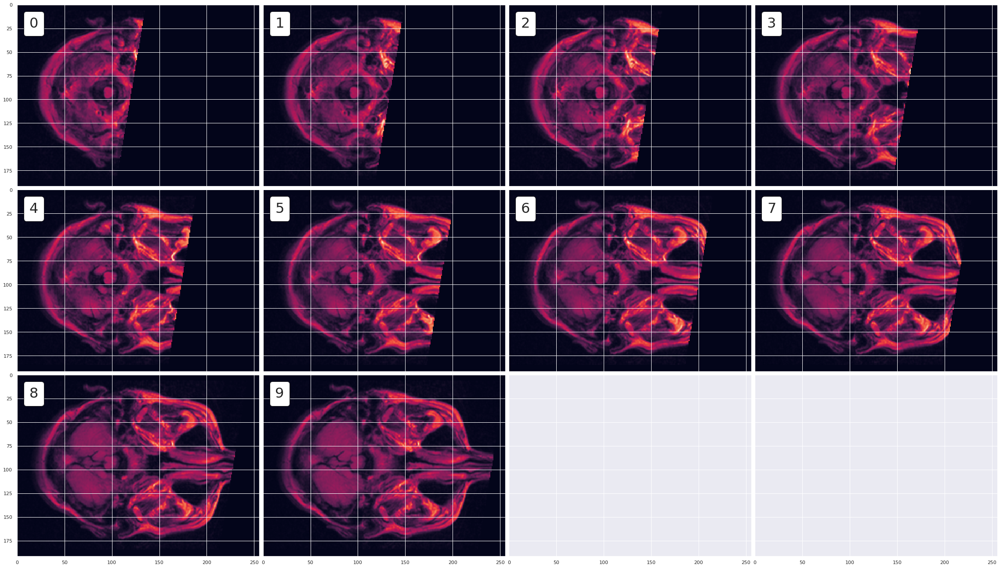

In [103]:
plot_dataset_with_label(v[:10,:,:,:], np.array(list(range(10))), max_elements=10)

In [106]:
v1 = cut_tails(v, 10)

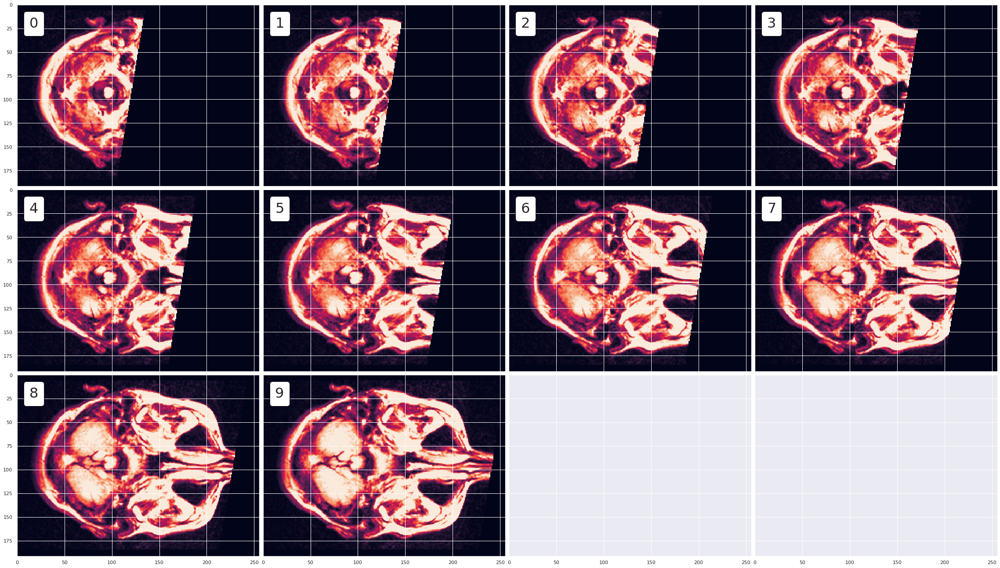

In [107]:
plot_dataset_with_label(v1[:10,:,:,:], np.array(list(range(10))), max_elements=10)

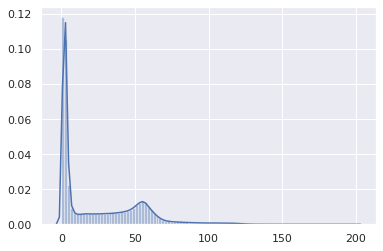

In [108]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import stats

sns.set(color_codes=True)

sns.distplot(v, bins=100);

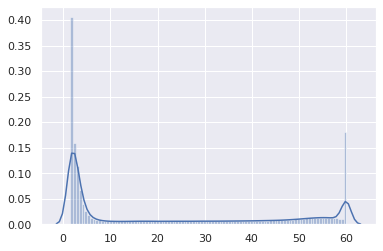

In [109]:
sns.distplot(v1, bins=100);

In [34]:
v.shape

(192, 256, 128)

IndexError: too many indices for array

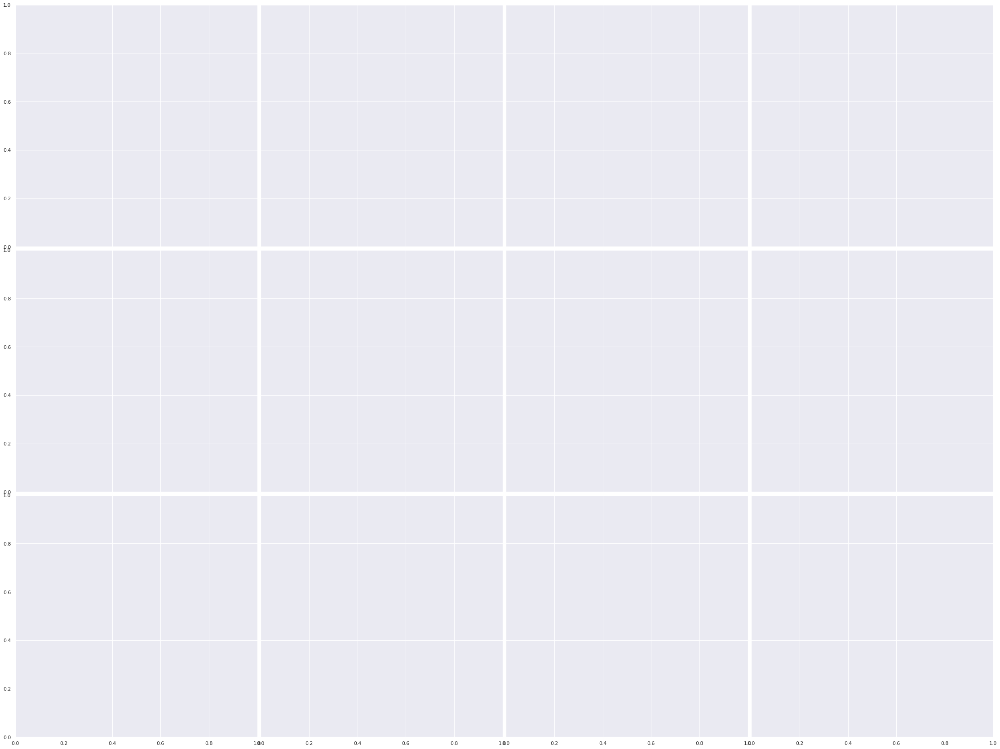

In [43]:
plot_dataset_with_label(np.array([v[:,:,i] for i in range(10)]), np.array(list(range(10))))

In [19]:
v[np.isnan(v)] = np.max(v)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in greater
  """Entry point for launching an IPython kernel.


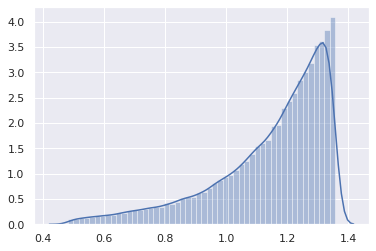

In [20]:
sns.distplot(v[v > 0].flatten());

In [10]:
    print(np.histogram(v))

(array([3645563,  771670, 1240849,  417172,  116564,   82502,   16581,
           513,      37,       5]), array([1.38411894e-01, 2.00844264e+01, 4.00304408e+01, 5.99764553e+01,
       7.99224697e+01, 9.98684842e+01, 1.19814499e+02, 1.39760513e+02,
       1.59706528e+02, 1.79652542e+02, 1.99598557e+02]))


In [26]:
import pickle
import pandas as pd
import numpy as np

def get_dataset_for_classification(dataset_path, classification_path):
    
    with open(dataset_path, "rb") as file:
        X = pickle.load(file)
        
    df = pd.read_csv(classification_path)
    subjects = np.array(df.iloc[:,1])
    labels = np.array(df.iloc[:,2])
    
    X_new = {}
    y_new = {}
    
    for i, subject in enumerate(subjects):
        if subject in X:
            X_new[subject] = X[subject]
            y_new[subject] = labels[i]
            
    print("Loaded dataset with", len(X_new.keys()), "subjects")
    
    return X_new, y_new

In [2]:
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import ImageGrid
import numpy as np
from matplotlib.offsetbox import AnchoredText
import matplotlib.pyplot as plt
import pickle

def draw_text_in_dataset(ax, text):
    at = AnchoredText(text, loc=2, prop=dict(size=32), frameon=True)
    at.patch.set_boxstyle("round,pad=0.,rounding_size=0.2")
    ax.add_artist(at)
    
def plot_slices(slices, max_elements=None):

    count = slices.shape[0]
    
    if not max_elements is None:
        count = min(max_elements, count)

    rows = int(count / 4) + 1

    fig = plt.figure(figsize=(40., rows * 10.))
    grid = ImageGrid(fig, 111,  # similar to subplot(111)
                     nrows_ncols=(rows, 4),  # creates 2x2 grid of axes
                     axes_pad=0.1,  # pad between axes in inch.
                     )

    for ax, im in zip(grid, [slices[i][:,:,0] for i in range(count)]):
        ax.imshow(im)

    plt.show()
    
def plot_dataset(dataset_path, classification_path, max_elements=None):

    X, y = get_dataset_for_classification(dataset_path, classification_path)
    
    subjects = np.array(list(X.keys()))
    
    count = subjects.shape[0]
    
    if not max_elements is None:
        count = min(max_elements, count)

    rows = int(count / 4) + 1

    fig = plt.figure(figsize=(40., rows * 10.))
    grid = ImageGrid(fig, 111,  # similar to subplot(111)
                     nrows_ncols=(rows, 4),  # creates 2x2 grid of axes
                     axes_pad=0.1,  # pad between axes in inch.
                     )

    for ax, (subject, im) in zip(grid, [(subject, X[subject][0,:,:,0]) for subject in subjects[:count]]):
        ax.imshow(im)
        draw_text_in_dataset(ax, subject)
        # ax.imshow(im_roi, alpha=0.5)

    plt.show()
    
"""
Save results in plot
"""
def save_training_plot(history, output_name):

    acc = history.history['acc']
    val_acc = history.history['val_acc']

    loss = history.history['loss']
    val_loss = history.history['val_loss']

    plt.figure(figsize=(8, 8))
    plt.subplot(2, 1, 1)
    plt.plot(acc, label='Training Accuracy')
    plt.plot(val_acc, label='Validation Accuracy')
    plt.legend(loc='lower right')
    plt.ylabel('Accuracy')
    plt.ylim([min(plt.ylim()),1])
    plt.title('Training and Validation Accuracy')

    plt.subplot(2, 1, 2)
    plt.plot(loss, label='Training Loss')
    plt.plot(val_loss, label='Validation Loss')
    plt.legend(loc='upper right')
    plt.ylabel('Cross Entropy')
    # plt.ylim([0,1.0])
    plt.title('Training and Validation Loss')
    plt.xlabel('epoch')

    plt.savefig(f"{output_name}.png")
    # plt.show()
    

# Bratz

In [12]:
plot_dataset(f"/data/RMN/dataset-gliomi-cnn/datasets-full-brain/bratz-t1-64-100.pickle", 
             f"/data/RMN/dataset-gliomi-cnn/dataset-survivor-brats19_new.csv")

In [27]:
plot_dataset(f"/data/RMN/dataset-gliomi-cnn/datasets-tumor-crop/bratz-t1-64-100.pickle", 
             f"/data/RMN/dataset-gliomi-cnn/dataset-survivor-brats19_new.csv")

Loaded dataset with 212 subjects


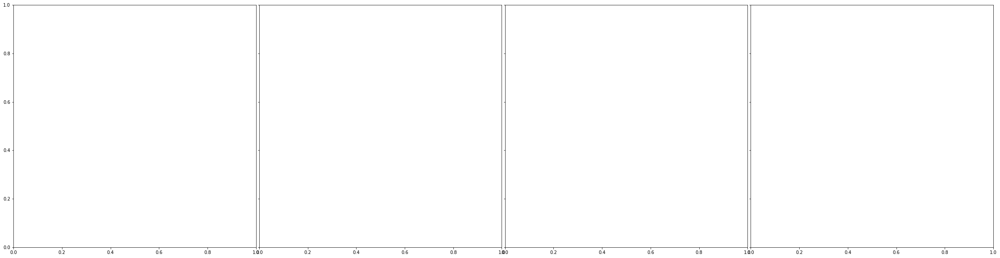

In [14]:
plot_dataset(f"/data/RMN/dataset-gliomi-cnn/datasets-full-brain/bratz-t1-224-100.pickle", 
             f"/data/RMN/dataset-gliomi-cnn/dataset-survivor-brats19_new.csv")

In [13]:
plot_dataset(f"/data/RMN/dataset-gliomi-cnn/datasets-full-brain/bratz-flair-64-100.pickle", 
             f"/data/RMN/dataset-gliomi-cnn/dataset-survivor-brats19_new.csv")

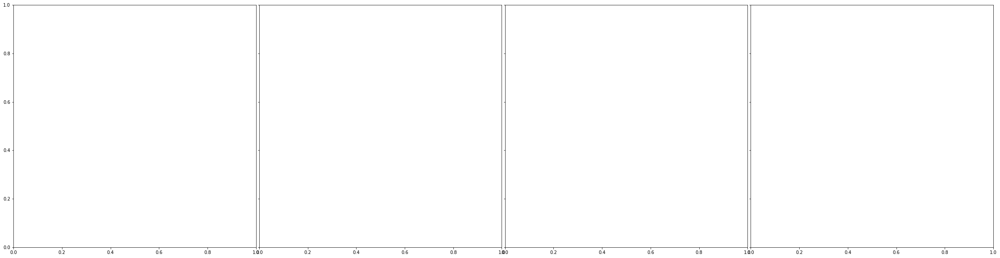

In [15]:
plot_dataset(f"/data/RMN/dataset-gliomi-cnn/datasets-full-brain/bratz-flair-224-100.pickle", 
             f"/data/RMN/dataset-gliomi-cnn/dataset-survivor-brats19_new.csv")

In [29]:
# RE_ATTILIO va eliminato da T1
# LUPO_ASSUNTA va eliminata da rCBV

In [ ]:
plot_dataset(f"/data/RMN/dataset-gliomi-cnn/datasets-full-brain/T1-64-100.pickle", 
             f"/data/RMN/dataset-gliomi-cnn/dataset-survivor.csv")

In [ ]:
plot_dataset(f"/data/RMN/dataset-gliomi-cnn/datasets-full-brain/T2-64-100.pickle", 
             f"/data/RMN/dataset-gliomi-cnn/dataset-survivor.csv")

In [ ]:
plot_dataset(f"/data/RMN/dataset-gliomi-cnn/datasets-full-brain/FLAIR-64-100.pickle", 
             f"/data/RMN/dataset-gliomi-cnn/dataset-survivor.csv")

In [ ]:
plot_dataset(f"/data/RMN/dataset-gliomi-cnn/datasets-full-brain/MPRAGE-64-100.pickle", 
             f"/data/RMN/dataset-gliomi-cnn/dataset-survivor.csv")

In [ ]:
plot_dataset(f"/data/RMN/dataset-gliomi-cnn/datasets-full-brain/ADC-64-100.pickle", 
             f"/data/RMN/dataset-gliomi-cnn/dataset-survivor.csv")

In [ ]:
plot_dataset(f"/data/RMN/dataset-gliomi-cnn/datasets-full-brain/rCBV-64-100.pickle", 
             f"/data/RMN/dataset-gliomi-cnn/dataset-survivor.csv")

In [ ]:
plot_dataset(f"/data/RMN/dataset-gliomi-cnn/datasets-tumor-crop/T1-64-100.pickle", 
             f"/data/RMN/dataset-gliomi-cnn/dataset-survivor.csv")

In [ ]:
plot_dataset(f"/data/RMN/dataset-gliomi-cnn/datasets-tumor-crop/T2-64-100.pickle", 
             f"/data/RMN/dataset-gliomi-cnn/dataset-survivor.csv")

In [ ]:
plot_dataset(f"/data/RMN/dataset-gliomi-cnn/datasets-tumor-crop/FLAIR-64-100.pickle", 
             f"/data/RMN/dataset-gliomi-cnn/dataset-survivor.csv")

In [ ]:
plot_dataset(f"/data/RMN/dataset-gliomi-cnn/datasets-tumor-crop/ADC-64-100.pickle", 
             f"/data/RMN/dataset-gliomi-cnn/dataset-survivor.csv")

In [ ]:
plot_dataset(f"/data/RMN/dataset-gliomi-cnn/datasets-tumor-crop/MPRAGE-64-100.pickle", 
             f"/data/RMN/dataset-gliomi-cnn/dataset-survivor.csv")

In [ ]:
plot_dataset(f"/data/RMN/dataset-gliomi-cnn/datasets-tumor-crop/rCBV-64-100.pickle", 
             f"/data/RMN/dataset-gliomi-cnn/dataset-survivor.csv")

# Cleanup GPU

In [4]:
from numba import cuda
cuda.select_device(0)
cuda.close()